<a href="https://colab.research.google.com/github/visiont3lab/deep-learning-course/blob/main/colab/Deploy_Segmentation_micro_sd_card.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Download dataset link: https://drive.google.com/file/d/1K0LRI_f5Fl8xUGCgU2wtvH2el-EiDThu/view?usp=sharing
# !unzip dataset.zip -d ciao
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1K0LRI_f5Fl8xUGCgU2wtvH2el-EiDThu' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1K0LRI_f5Fl8xUGCgU2wtvH2el-EiDThu" -O dataset.zip && rm -rf /tmp/cookies.txt
!unzip dataset.zip
#!rm dataset.zip 
!mv dataset-micro-sd-card dataset

## Load Trained Models and Export to Onnx

In [2]:
import torch
from torch import nn
from torchsummary import summary
import torch.nn.functional as F

In [ ]:
class SegNet(nn.Module):
    
    def __init__(self, params):
        super(SegNet, self).__init__()
        
        C_in, H_in, W_in=params["input_shape"]
        init_f=params["initial_filters"] 
        num_outputs=params["num_outputs"] 

        self.conv1 = nn.Conv2d(C_in, init_f, kernel_size=3,stride=1,padding=1)
        self.conv2 = nn.Conv2d(init_f, 2*init_f, kernel_size=3,stride=1,padding=1)
        self.conv3 = nn.Conv2d(2*init_f, 4*init_f, kernel_size=3,padding=1)
        self.conv4 = nn.Conv2d(4*init_f, 8*init_f, kernel_size=3,padding=1)
        self.conv5 = nn.Conv2d(8*init_f, 16*init_f, kernel_size=3,padding=1)

        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        self.conv_up1 = nn.Conv2d(16*init_f, 8*init_f, kernel_size=3,padding=1)
        self.conv_up2 = nn.Conv2d(8*init_f, 4*init_f, kernel_size=3,padding=1)
        self.conv_up3 = nn.Conv2d(4*init_f, 2*init_f, kernel_size=3,padding=1)
        self.conv_up4 = nn.Conv2d(2*init_f, init_f, kernel_size=3,padding=1)

        self.conv_out = nn.Conv2d(init_f, num_outputs , kernel_size=3,padding=1)    
        
    def forward(self, x):
        
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)

        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)

        x = F.relu(self.conv3(x))
        x = F.max_pool2d(x, 2, 2)

        x = F.relu(self.conv4(x))
        x = F.max_pool2d(x, 2, 2)

        x = F.relu(self.conv5(x))

        x=self.upsample(x)
        x = F.relu(self.conv_up1(x))

        x=self.upsample(x)
        x = F.relu(self.conv_up2(x))
        
        x=self.upsample(x)
        x = F.relu(self.conv_up3(x))
        
        x=self.upsample(x)
        x = F.relu(self.conv_up4(x))

        x = self.conv_out(x)
        
        # Output activation layer --> if u put this use BCELoss not BECLossWithLogit
        x = torch.sigmoid(x)
        
        return x

# Load pretrained segnet
h,w = (224,224)
model_segnet = SegNet({"input_shape": (3,h,w),"initial_filters": 16, "num_outputs": 1}).to('cpu')
model_segnet.load_state_dict(torch.load("dataset/models/model_segnet.pt", map_location=torch.device("cpu")))
torch.onnx.export(model_segnet.cpu(),  torch.randn(1, 3, h, w), "model_segnet.onnx",verbose=True, opset_version=11)
#print(model)
#summary(net, input_size=(3, h, w),device='cpu')

In [ ]:
class UNet(nn.Module):

    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3,stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3,stride=1, padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3,stride=1, padding=1)
        self.conv4 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3,stride=1, padding=1)
        self.conv5 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3,stride=1, padding=1)
      
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)        
       
        self.conv_up1 = nn.Conv2d(in_channels=256+128, out_channels=128, kernel_size=3,stride=1, padding=1)    
        self.conv_up2 = nn.Conv2d(in_channels=128+64, out_channels=64, kernel_size=3,stride=1, padding=1)
        self.conv_up3 = nn.Conv2d(in_channels=64+32, out_channels=32, kernel_size=3,stride=1, padding=1)
        self.conv_up4 = nn.Conv2d(in_channels=32+16, out_channels=16, kernel_size=3,stride=1, padding=1)
       
        self.conv_out = nn.Conv2d(16, 1 , kernel_size=3,padding=1) 
            
    def forward(self, x):
        
        conv1 = F.relu( self.conv1(x) )
        x = F.max_pool2d(conv1, 2, 2)
        
        conv2 = F.relu( self.conv2(x) )
        x = F.max_pool2d(conv2, 2, 2)
        
        conv3 = F.relu( self.conv3(x) )
        x = F.max_pool2d(conv3, 2, 2)
        
        conv4 = F.relu( self.conv4(x) )
        x = F.max_pool2d(conv4, 2, 2)
       
        conv5 = F.relu( self.conv5(x) )
    
        x = self.upsample(conv5)
        x = torch.cat([x, conv4], dim=1)

        x = F.relu( self.conv_up1(x))
        x = self.upsample(x)
        x = torch.cat([x, conv3], dim=1)

        x = F.relu( self.conv_up2(x))
        x = self.upsample(x)
        x = torch.cat([x, conv2], dim=1)

        x = F.relu( self.conv_up3(x))
        x = self.upsample(x)
        x = torch.cat([x, conv1], dim=1)
 
        x = F.relu( self.conv_up4(x))
    
        x = self.conv_out(x)
        
        # Output activation layer --> if u put this use BCELoss not BECLossWithLogit
        x = torch.sigmoid(x)
        
        return x
  
# Load pretrained unet
h,w = (224,224)
model_unet = UNet().to('cpu')
model_unet.load_state_dict(torch.load("dataset/models/model_unet.pt",map_location=torch.device("cpu")))
torch.onnx.export(model_unet.cpu(),  torch.randn(1, 3, h, w), "model_unet.onnx",verbose=True, opset_version=11)
#print(model)
#summary(net, input_size=(3, h, w),device='cpu')

## Inference on New Images

In [ ]:
!pip install onnxruntime

In [7]:
import onnxruntime as rt
import numpy as np
import cv2
from PIL import Image
import math
import os
import timeit
import pandas as pd
import shutil

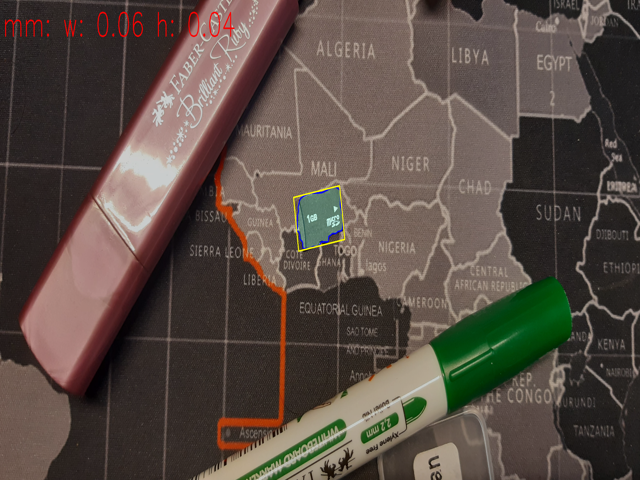

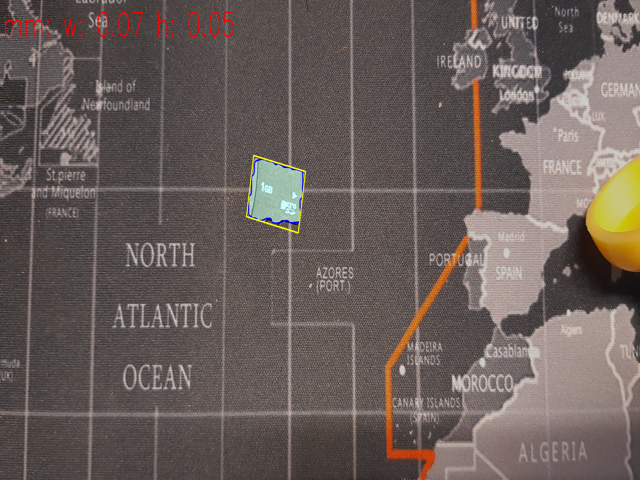

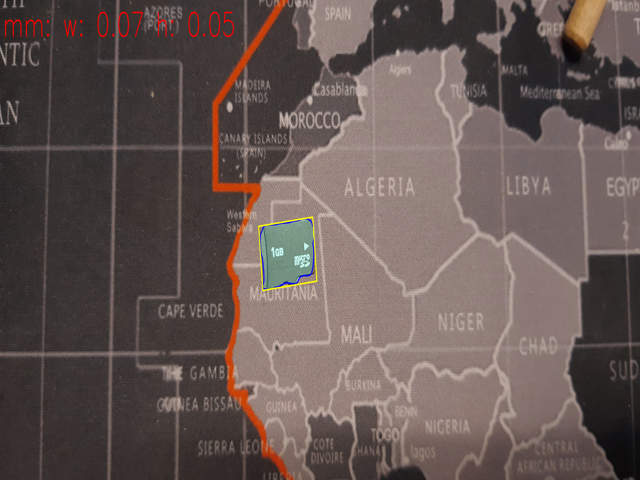

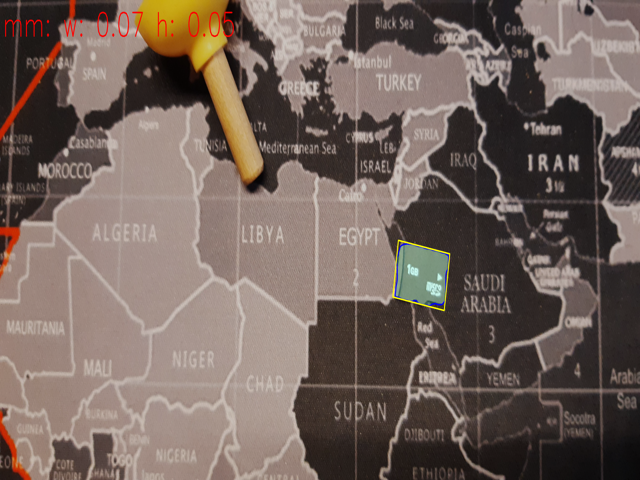

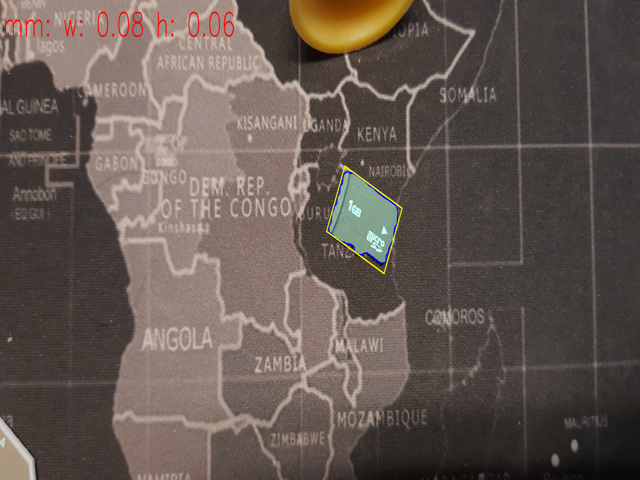

...

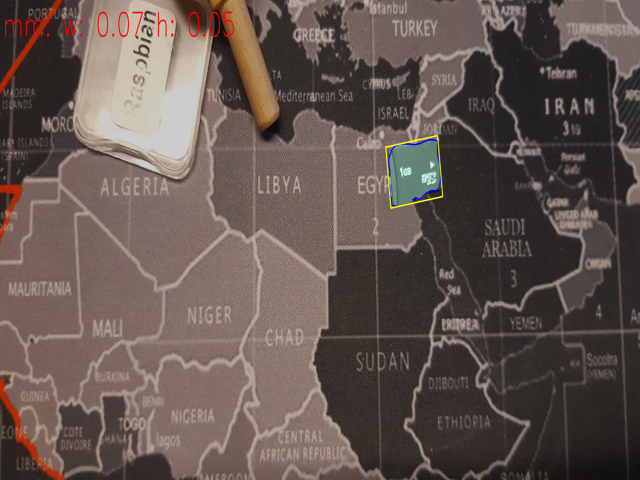

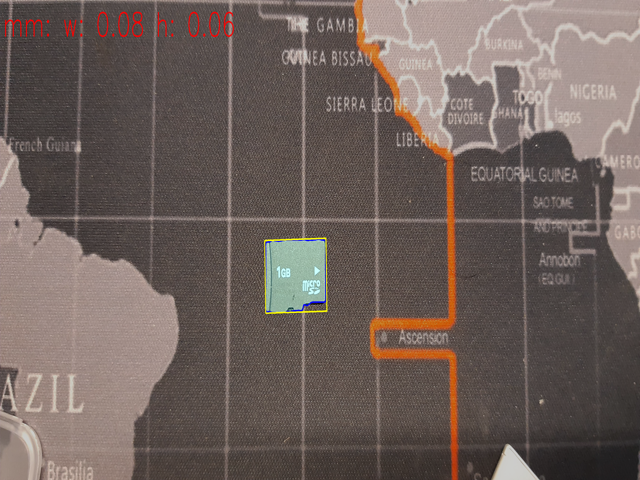

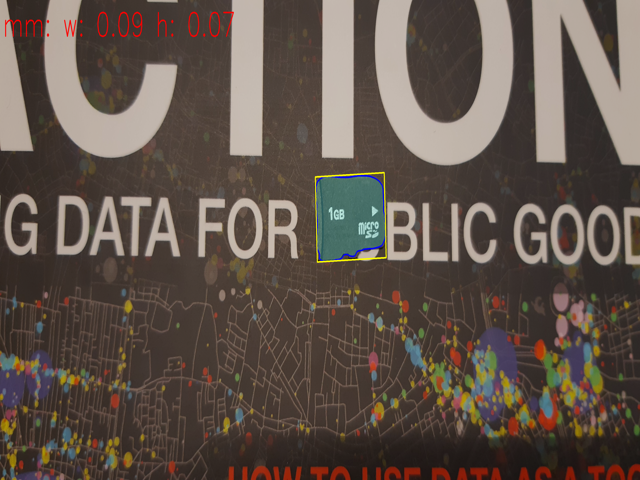

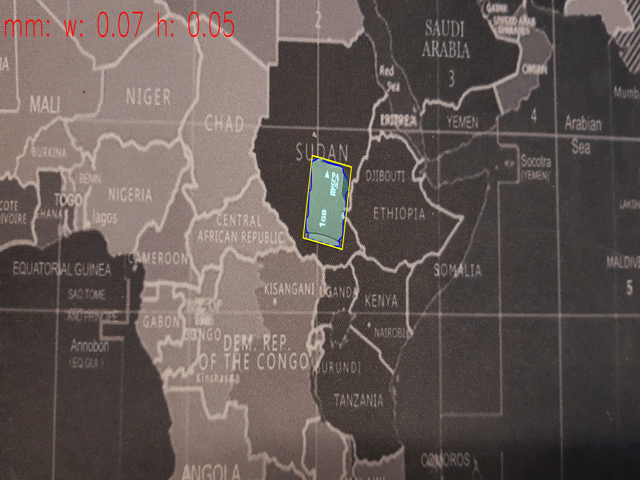

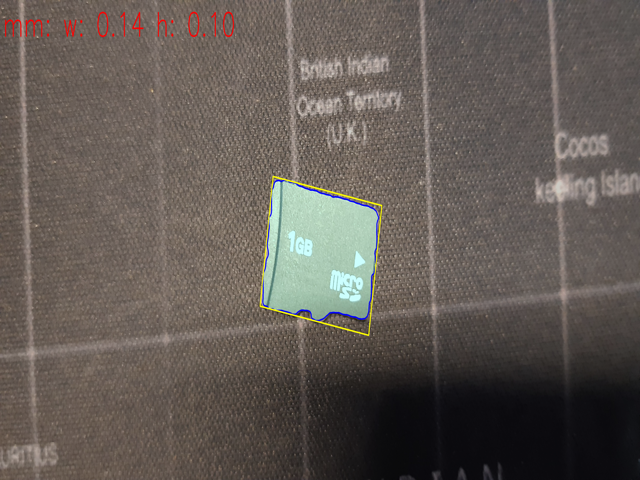

KeyboardInterrupt: ignored

In [58]:
# [Metrics Jaccard Index (IOU), DICE ](https://ilmonteux.github.io/2019/05/10/segmentation-metrics.html)

# jaccard index
def iou(pred, target):
    intersection = np.logical_and(pred,target) # Logical AND
    union = np.logical_or(pred,target) # Logical AND
    IOU = intersection.sum()/float(union.sum() ) 
    return IOU

class SegmentationInference:

    def __init__(self,path2model):
        self.sess = rt.InferenceSession(path2model)
        self.input_name = self.sess.get_inputs()[0].name
        self.input_shape = self.sess.get_inputs()[0].shape
        self.h = self.input_shape[2]
        self.w = self.input_shape[3]
        self.input_type = self.sess.get_inputs()[0].type
        self.output_name = self.sess.get_outputs()[0].name
        self.output_shape = self.sess.get_outputs()[0].shape
        self.output_type = self.sess.get_outputs()[0].type 

    def print_model_info(self):
        # Input informations
        print("input name", self.input_name)
        print("input shape", self.input_shape)
        print("input type", self.input_type)
        # Outpout informations
        print("output name", self.output_name)
        print("output shape", self.output_shape)
        print("output type", self.output_type)
    
    def predict(self, image):   
        initial_w,initial_h = (image.shape[1],image.shape[0])
        image = cv2.resize(image, (self.w,self.h))
        image = image.astype(np.float32)/255.0
        image  = np.moveaxis(image, -1, 0) # from 224x224x3 --> 3x224x224
        x = image[np.newaxis,:,:] # 1,3,224,224
        mask_hat = self.sess.run([self.output_name], {self.input_name: x})[0]
        mask_hat = 255*mask_hat[0][0]
        mask_hat = mask_hat.astype(np.uint8)
        mask_hat = cv2.resize(mask_hat, (initial_w,initial_h))
        return mask_hat

    def visualize(self,image,mask):
        # Overlapping Opencv
        initial_w,initial_h = (image.shape[1],image.shape[0])
        mask = cv2.resize(mask,(initial_w,initial_h ))
        mask_col = cv2.cvtColor(mask,cv2.COLOR_GRAY2RGB)
        mask_col[(mask>127)] = [0,255,255]
        overlay = cv2.addWeighted(image,0.8,mask_col,0.2,0)
        return overlay
    
    def extract_rect(self,image,mask,resolution_mm):    
        # Overlay draw
        mask_col = cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR)
        mask_col[(mask>127)] = [0,255,255]
        overlay = cv2.addWeighted(image,0.8,mask_col,0.2,0)
        # Mask postprocessing
        ret2,th2 = cv2.threshold(mask,127,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        contours, hierarchy = cv2.findContours(th2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        # Max contour
        w = 0
        h = 0
        box = None
        if contours:
            c = max(contours, key = cv2.contourArea)
            rect = cv2.minAreaRect(c)
            # ((center(x, y), (width, height), angle of rotation)
            (x, y), (w, h), angle = rect
            if h>w:
                w,h = h,w
            # Conversion pix2mm
            w = w* resolution_mm #pix2mm
            h = h* resolution_mm #pix2mm
            # Draw rotating bounding box
            box = cv2.boxPoints(rect)
            box = np.int0(box) #np.intp: Integer used for indexing (same as C ssize_t; normally either int32 or int64)
            cv2.drawContours(overlay, [c], 0, (0,0,255),5)    
            cv2.drawContours(overlay, [box], 0, (255,255,0),5)    
            cv2.putText(overlay, "mm: w: %.2f h: %.2f" % (w,h),(20, 160), cv2.FONT_HERSHEY_SIMPLEX, 5, (255, 0, 0),6)
        return overlay,w,h,box

path2model = "model_unet.onnx"
#path2model = "model_segnet.onnx"

path2Images = os.path.join("dataset","images")
path2Res = os.path.join("dataset","results")
if not os.path.exists(path2Res):
  os.makedirs(path2Res)

segInf = SegmentationInference(path2model)
#segInf.print_model_info()

names = os.listdir(path2Images)
sum_time_sec = 0
for name in names:
    # Reading
    frame = cv2.imread(os.path.join(path2Images,name),cv2.IMREAD_COLOR)   
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Start timer
    start = timeit.default_timer()

    # Preprocess image and mask (crop rod)
    mask_hat = segInf.predict(frame)
              
    # End timer
    stop = timeit.default_timer()
    sum_time_sec+= (stop-start)
    
    # Normalize
    overlay,w,h,box = segInf.extract_rect(frame,mask_hat,resolution_mm=0.00018)
    display(Image.fromarray(overlay).resize((640,480)))
    #cv2.imwrite(os.path.join(path2Res,name),overlay)

print(f"Average time to process {len(names)} images: {np.round(sum_time_sec/len(names),4)} ms")

In [ ]:
# zip results to download
!zip -r dataset/results results.zip